In [41]:
import pandas as pd
import numpy as np

In [43]:
data_import = pd.read_csv("creditcard.csv")
data_import

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0.0
1,0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0.0
2,1,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0.0
3,1,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0.0
4,2,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89215,62476,-0.815634,-0.244177,2.591455,-0.002720,-0.644497,0.418909,0.255767,0.115134,0.649661,...,-0.133162,-0.239654,0.095507,0.125146,-0.118362,1.077141,-0.173607,-0.148471,112.18,0.0
89216,62476,1.121527,0.208353,0.202133,1.138648,0.068794,-0.158828,0.176503,-0.105339,-0.145071,...,0.115269,0.354326,-0.179000,-0.240712,0.663680,-0.237553,0.031241,0.025737,53.64,0.0
89217,62478,-1.344549,0.543027,1.991882,-1.118447,-0.949264,0.196963,-0.070728,0.809195,0.331360,...,-0.134573,-0.417982,-0.071393,0.047068,0.267058,0.861676,0.067080,0.042724,69.00,0.0
89218,62480,0.789027,-1.180048,-0.633627,-0.141463,-0.317314,-0.124994,0.407588,-0.286734,-1.371513,...,-0.567100,-1.844598,-0.140709,-0.779335,0.129177,0.184364,-0.076960,0.060438,328.80,0.0


## Breaking up our dataset into constituent parts

In [44]:
extra_columns = data_import[["Time", "Amount"]]
y = data_import["Class"]
X = data_import.iloc[:, 1:-2]
X

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89215,-0.815634,-0.244177,2.591455,-0.002720,-0.644497,0.418909,0.255767,0.115134,0.649661,-0.713041,...,0.987900,0.365671,-0.133162,-0.239654,0.095507,0.125146,-0.118362,1.077141,-0.173607,-0.148471
89216,1.121527,0.208353,0.202133,1.138648,0.068794,-0.158828,0.176503,-0.105339,-0.145071,-0.029333,...,-0.719945,0.000990,0.115269,0.354326,-0.179000,-0.240712,0.663680,-0.237553,0.031241,0.025737
89217,-1.344549,0.543027,1.991882,-1.118447,-0.949264,0.196963,-0.070728,0.809195,0.331360,-1.167614,...,0.213963,0.053575,-0.134573,-0.417982,-0.071393,0.047068,0.267058,0.861676,0.067080,0.042724
89218,0.789027,-1.180048,-0.633627,-0.141463,-0.317314,-0.124994,0.407588,-0.286734,-1.371513,0.532217,...,-0.804532,0.204092,-0.567100,-1.844598,-0.140709,-0.779335,0.129177,0.184364,-0.076960,0.060438


### Simple PCA Into 2 Dimensions

In [45]:
from sklearn.decomposition import PCA
X = X.dropna()
pca = PCA(n_components = 2)
X2D = pca.fit_transform(X)

In [46]:
X2D

array([[ 0.42227648,  0.66612963],
       [-1.09355835, -0.73051197],
       [ 0.46641799,  1.46198838],
       ...,
       [-1.0527132 , -0.63811734],
       [ 0.51060031,  0.17679282],
       [-0.62630482,  0.37858862]])

### Choosing the Right Number of Dimensions

In [47]:
# How many dimensions do we need to explain a large amount of the variance

pca = PCA()

pca.fit(X)
cumsum = np.cumsum(pca.explained_variance_ratio_)
d = np.argmax(cumsum >= 0.95) + 1
print("95% of variance explained by ", d, " variables")

95% of variance explained by  22  variables


In [10]:
cumsum

array([0.12483757, 0.21356702, 0.28837636, 0.35360784, 0.41559829,
       0.47335421, 0.52315273, 0.56956969, 0.60884466, 0.64742333,
       0.68132481, 0.71381239, 0.7460451 , 0.77594586, 0.80320759,
       0.82819207, 0.85166522, 0.87452552, 0.89608823, 0.91542731,
       0.93298321, 0.95011992, 0.96280874, 0.97474451, 0.9835865 ,
       0.99115334, 0.99645466, 1.        ])

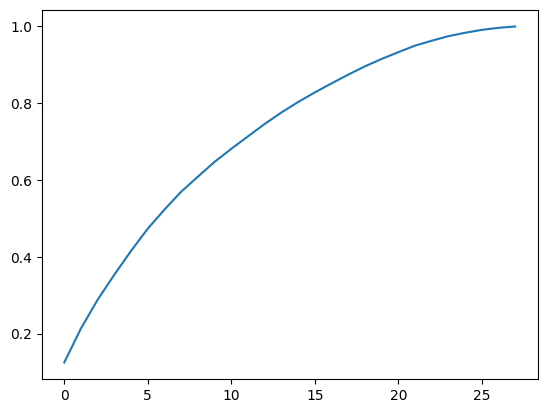

In [11]:
# How the PCA improves over time
import matplotlib.pyplot as plt
plt.plot(cumsum)

In [12]:
pca = PCA(n_components=0.95)
X_reduced = pca.fit_transform(X)
X_reduced

array([[ 1.35980713e+00,  7.27811733e-02, -2.53634674e+00, ...,
        -2.51412098e-01,  1.83067779e-02, -2.77837576e-01],
       [-1.19185711e+00, -2.66150712e-01, -1.66480113e-01, ...,
         6.90831352e-02,  2.25775248e-01,  6.38671953e-01],
       [ 1.35835406e+00,  1.34016307e+00, -1.77320934e+00, ...,
        -5.24979725e-01, -2.47998153e-01, -7.71679402e-01],
       ...,
       [-1.91956501e+00,  3.01253846e-01,  3.24963981e+00, ...,
        -1.39597029e-03, -2.32045036e-01, -5.78229010e-01],
       [ 2.40440050e-01, -5.30482513e-01, -7.02510230e-01, ...,
        -1.27433516e-01, -2.65244916e-01, -8.00048741e-01],
       [ 5.33412522e-01,  1.89733337e-01, -7.03337367e-01, ...,
        -3.82948105e-01, -2.61057331e-01, -6.43078438e-01]])

## Reconstructing PCA

In [13]:
X_recovered = pca.inverse_transform(X_reduced)
X_recovered

array([[-1.35980713e+00, -7.27811733e-02,  2.53634674e+00, ...,
         1.90807720e-15, -1.50315854e-15, -1.92086370e-15],
       [ 1.19185711e+00,  2.66150712e-01,  1.66480113e-01, ...,
         1.55951115e-15, -1.47235931e-15, -2.43896754e-16],
       [-1.35835406e+00, -1.34016307e+00,  1.77320934e+00, ...,
         2.79794888e-15, -4.66724280e-15, -1.26883472e-15],
       ...,
       [ 1.91956501e+00, -3.01253846e-01, -3.24963981e+00, ...,
         3.35160895e-15, -2.45366988e-15, -8.94224689e-16],
       [-2.40440050e-01,  5.30482513e-01,  7.02510230e-01, ...,
         3.77012087e-15, -1.59943336e-15, -2.54948712e-15],
       [-5.33412522e-01, -1.89733337e-01,  7.03337367e-01, ...,
         1.15935981e-15,  3.60938221e-16, -4.45146534e-17]])

## Kernel PCA (kPCA)

In [14]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.decomposition import KernelPCA

# Check the shapes of the arrays
print(f"X shape: {X.shape}")
print(f"y shape: {y.shape}")

# If the shapes are different, you can pad or truncate one of the arrays to match the other
# For example, if X_train has more samples than y_train, you can truncate X_train
if X.shape[0] > y.shape[0]:
    X = X_train[:y.shape[0], :]
else:
    y = y[:X.shape[0]]

# Now, the shapes should be the same
print(f"X shape: {X.shape}")
print(f"y shape: {y.shape}")

X shape: (284807, 28)
y shape: (284807,)
X shape: (284807, 28)
y shape: (284807,)


In [ ]:
clf = Pipeline([
								("kpca", KernelPCA(n_components=2)),
								("log_reg", LogisticRegression())
])

param_grid = [{
							"kpca__gamma":np.linspace(0.03, 0.05, 10),
							"kpca__kernel":["rbf", "sigmoid"]
}]

grid_search = GridSearchCV(clf, param_grid, cv=3, pre_dispatch=2)#you can use the pre_dispatch parameter to control how many cores are used for the search.
grid_search.fit(X, y)

In [1]:
print(grid_search.best_params_)

NameError: name 'grid_search' is not defined

## Visualizing Multi-Dimensional Data Through PCA

In [50]:
from sklearn.decomposition import PCA

pca = PCA(n_components = 3)
X3D = pca.fit_transform(X)
X3D

array([[ 0.42178578,  0.66420052, -1.04668542],
       [-1.09445505, -0.72814424,  0.42033054],
       [ 0.47350875,  1.45721086,  0.09141482],
       ...,
       [-1.05023705, -0.6390713 ,  0.28149867],
       [ 0.50817025,  0.17938447, -0.65687853],
       [-0.61771678,  0.37279991,  1.41367919]])

In [51]:
pca_plot_data = pd.DataFrame(X3D)
pca_plot_data["Class"] = y
pca_plot_data = pca_plot_data#.sample(1000) # Without sampling the notebook is significantly larger
pca_plot_data

,0,1,2,Class
0,0.421786,0.664201,-1.046685,0.0
1,-1.094455,-0.728144,0.420331,0.0
2,0.473509,1.457211,0.091415,0.0
3,-0.005466,0.690630,-0.613580,0.0
4,0.403425,-0.110651,-1.543924,0.0
...,...,...,...,...
89214,1.331233,2.484276,-0.339369,0.0
89215,-0.146735,0.882688,-0.598574,0.0
89216,-1.050237,-0.639071,0.281499,0.0
89217,0.508170,0.179384,-0.656879,0.0


In [52]:
# import matplotlib.pyplot as plt

# plt.scatter(x=pca_plot_data[0], y=pca_plot_data[1], c=pca_plot_data["Class"], alpha=0.5)

import plotly.express as px

fig = px.scatter_3d(pca_plot_data, x=0, y=1, z=2,
              color='Class')
fig.show()

In [54]:
pca_plot_data_fraud = pca_plot_data[pca_plot_data["Class"] == 1]
pca_plot_data_fraud

,0,1,2,Class
541,4.784712,-4.448842,2.426272,1.0
623,2.618232,3.420194,-0.171084,1.0
4920,3.470461,-3.381202,0.884471,1.0
6108,8.755575,-6.171285,4.850501,1.0
6329,0.500858,-4.318557,-0.073754,1.0
...,...,...,...,...
88258,4.810769,-6.364547,3.194012,1.0
88307,5.031134,-6.415949,4.415623,1.0
88876,-0.193320,-1.979862,0.710713,1.0
88897,11.358613,-8.469463,6.865016,1.0


In [55]:
fig_fraud = px.scatter_3d(pca_plot_data_fraud, x=0, y=1, z=2,
              color='Class')
fig_fraud.show()

In [56]:
pca_plot_data_not_fraud = pca_plot_data[pca_plot_data["Class"] == 0]
pca_plot_data_not_fraud

,0,1,2,Class
0,0.421786,0.664201,-1.046685,0.0
1,-1.094455,-0.728144,0.420331,0.0
2,0.473509,1.457211,0.091415,0.0
3,-0.005466,0.690630,-0.613580,0.0
4,0.403425,-0.110651,-1.543924,0.0
...,...,...,...,...
89214,1.331233,2.484276,-0.339369,0.0
89215,-0.146735,0.882688,-0.598574,0.0
89216,-1.050237,-0.639071,0.281499,0.0
89217,0.508170,0.179384,-0.656879,0.0


In [57]:
fig_not_fraud = px.scatter_3d(pca_plot_data_not_fraud, x=0, y=1, z=2,
              color='Class')

fig_not_fraud.show()

Load the MNIST dataset (introduced in Chapter 3) and split it into a training set
and a test set (take the first 60,000 instances for training, and the remaining
10,000 for testing). Train a Random Forest classifier on the dataset and time how
long it takes, then evaluate the resulting model on the test set. Next, use PCA to
reduce the dataset’s dimensionality, with an explained variance ratio of 95%.
Train a new Random Forest classifier on the reduced dataset and see how long it
takes. Was training much faster? Next evaluate the classifier on the test set: how
does it compare to the previous classifier?

In [5]:
from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn.datasets import fetch_openml

mnist = fetch_openml('mnist_784', as_frame=False, parser="auto")
X_train, y_train = mnist.data[:60_000], mnist.target[:60_000]
X_test, y_test = mnist.data[60_000:], mnist.target[60_000:]

pca = PCA()
pca.fit(X_train)
cumsum = np.cumsum(pca.explained_variance_ratio_)
d = np.argmax(cumsum >= 0.95) + 1  # d equals 154


In [6]:
cumsum

array([0.09704664, 0.16800588, 0.22969677, 0.28359097, 0.33227894,
       0.37540125, 0.40812055, 0.4369595 , 0.4645798 , 0.4881498 ,
       0.5092417 , 0.52947161, 0.54662979, 0.56355091, 0.57933732,
       0.59416685, 0.60741246, 0.62018143, 0.63205406, 0.6435809 ,
       0.65424256, 0.66430969, 0.67384542, 0.68297086, 0.69180491,
       0.7001981 , 0.70832389, 0.71618755, 0.72363488, 0.73054347,
       0.73712441, 0.74360589, 0.74963204, 0.75549786, 0.76119807,
       0.76663435, 0.77169222, 0.7765708 , 0.7813851 , 0.78610776,
       0.79067523, 0.79512359, 0.7993086 , 0.80329076, 0.8071405 ,
       0.81089154, 0.81451162, 0.81802754, 0.82142812, 0.82464686,
       0.82783703, 0.83096508, 0.83392491, 0.83681446, 0.83965576,
       0.84237012, 0.84506533, 0.84765006, 0.85018776, 0.85263557,
       0.85504063, 0.85743326, 0.85973735, 0.86195267, 0.86408988,
       0.86616213, 0.86819256, 0.87016038, 0.87208891, 0.87397523,
       0.875845  , 0.87765583, 0.87943146, 0.88118044, 0.88283

In [7]:
d

154

 Train a Random Forest classifier on the dataset and time how long it takes, then evaluate the resulting model on the test set.

In [14]:
import sklearn.ensemble
rnd_clf = sklearn.ensemble.RandomForestClassifier(n_estimators=100, random_state=42)

In [10]:
%time rnd_clf.fit(X_train, y_train)

CPU times: user 45.4 s, sys: 92.3 ms, total: 45.5 s
Wall time: 47.5 s


RandomForestClassifier(random_state=42)

In [11]:
from sklearn.metrics import accuracy_score

y_pred = rnd_clf.predict(X_test)
accuracy_score(y_test, y_pred)



0.9705

Exercise: Next, use PCA to reduce the dataset's dimensionality, with an explained variance ratio of 95%.

In [12]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)
X_train_reduced = pca.fit_transform(X_train)

Exercise: Train a new Random Forest classifier on the reduced dataset and see how long it takes. Was training much faster?

In [16]:
rnd_clf_with_pca = sklearn.ensemble.RandomForestClassifier(n_estimators=100, random_state=42)
%time rnd_clf_with_pca.fit(X_train_reduced, y_train)

CPU times: user 1min 56s, sys: 94.4 ms, total: 1min 56s
Wall time: 1min 59s


RandomForestClassifier(random_state=42)

raining is actually about twice slower now! How can that be? Well, as we saw in this chapter, dimensionality reduction does not always lead to faster training time: it depends on the dataset, the model and the training algorithm. See figure 8-6 (the manifold_decision_boundary_plot* plots above). If you try SGDClassifier instead of RandomForestClassifier, you will find that training time is reduced by a factor of 3 when using PCA.

let's check the precision of the new random forest classifier.

Exercise: Next evaluate the classifier on the test set: how does it compare to the previous classifier?

In [17]:
X_test_reduced = pca.transform(X_test)

y_pred = rnd_clf_with_pca.predict(X_test_reduced)
accuracy_score(y_test, y_pred)

0.9481

It is common for performance to drop slightly when reducing dimensionality, because we do lose some potentially useful signal in the process. However, the performance drop is rather severe in this case. So PCA really did not help: it slowed down training and reduced performance.

Exercise: Try again with an SGDClassifier. How much does PCA help now?

In [18]:
from sklearn.linear_model import SGDClassifier

sgd_clf = SGDClassifier(random_state=42)
%time sgd_clf.fit(X_train, y_train)

CPU times: user 2min 53s, sys: 293 ms, total: 2min 53s
Wall time: 3min 1s


SGDClassifier(random_state=42)

In [19]:
y_pred = sgd_clf.predict(X_test)
accuracy_score(y_test, y_pred)

0.874

Okay, so the SGDClassifier takes much longer to train on this dataset than the RandomForestClassifier, plus it performs worse on the test set. But that's not what we are interested in right now, we want to see how much PCA can help SGDClassifier. Let's train it using the reduced dataset:

In [20]:
sgd_clf_with_pca = SGDClassifier(random_state=42)
%time sgd_clf_with_pca.fit(X_train_reduced, y_train)

CPU times: user 38.8 s, sys: 76.3 ms, total: 38.9 s
Wall time: 44.7 s


SGDClassifier(random_state=42)

Nice! Reducing dimensionality led to roughly 5× speedup. :) Let's check the model's accuracy:

In [21]:
y_pred = sgd_clf_with_pca.predict(X_test_reduced)
accuracy_score(y_test, y_pred)

0.8959

Great! PCA not only gave us a 5× speed boost, it also improved performance slightly.

So there you have it: PCA can give you a formidable speedup, and if you're lucky a performance boost... but it's really not guaranteed: it depends on the model and the dataset!

Exercise: Use t-SNE to reduce the first 5,000 images of the MNIST dataset down to two dimensions and plot the result using Matplotlib. You can use a scatterplot using 10 different colors to represent each image's target class.

Let's limit ourselves to the first 5,000 images of the MNIST training set, to speed things up a lot.

In [22]:
X_sample, y_sample = X_train[:5000], y_train[:5000]

Let's use t-SNE to reduce dimensionality down to 2D so we can plot the dataset:

In [23]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, init="random", learning_rate="auto",
            random_state=42)
%time X_reduced = tsne.fit_transform(X_sample)

CPU times: user 1min 25s, sys: 164 ms, total: 1min 25s
Wall time: 1min 2s


Now let's use Matplotlib's scatter() function to plot a scatterplot, using a different color for each digit:

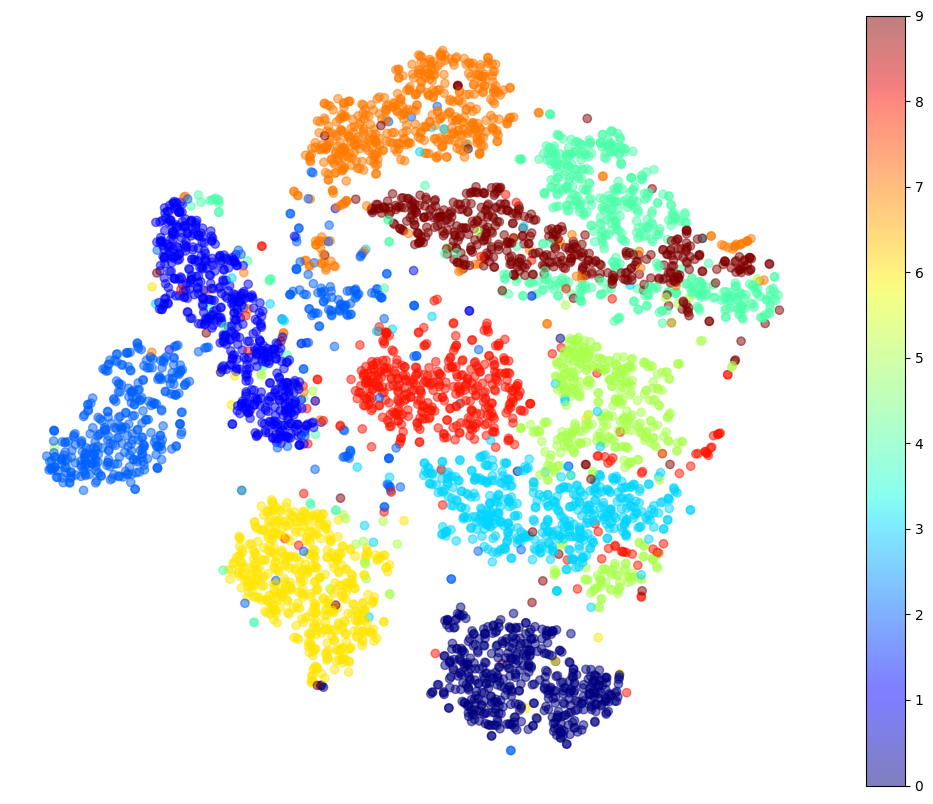

In [26]:
import matplotlib.pyplot as plt

plt.figure(figsize=(13, 10))
plt.scatter(X_reduced[:, 0], X_reduced[:, 1],
            c=y_sample.astype(np.int8), cmap="jet", alpha=0.5)
plt.axis('off')
plt.colorbar()
plt.show()

Isn't this just beautiful? :) Most digits are nicely separated from the others, even though t-SNE wasn't given the targets: it just identified clusters of similar images. But there is still a bit of overlap. For example, the 3s and the 5s overlap a lot (on the right side of the plot), and so do the 4s and the 9s (in the top-right corner).

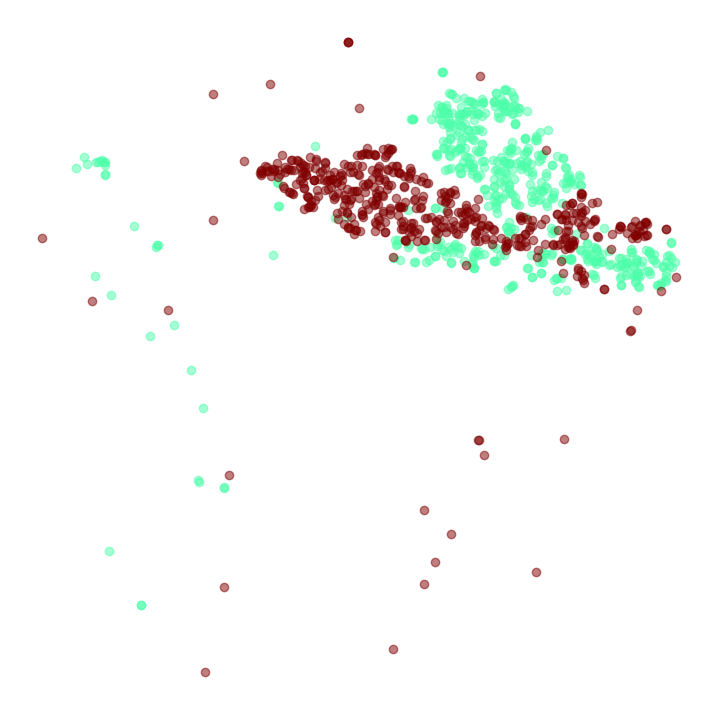

In [27]:
plt.figure(figsize=(9, 9))
cmap = plt.cm.jet
for digit in ('4', '9'):
    plt.scatter(X_reduced[y_sample == digit, 0], X_reduced[y_sample == digit, 1],
                c=[cmap(float(digit) / 9)], alpha=0.5)
plt.axis('off')
plt.show()

Let's see if we can produce a nicer image by running t-SNE on just these 2 digits:

In [28]:
idx = (y_sample == '4') | (y_sample == '9')
X_subset = X_sample[idx]
y_subset = y_sample[idx]

tsne_subset = TSNE(n_components=2, init="random", learning_rate="auto",
                   random_state=42)
X_subset_reduced = tsne_subset.fit_transform(X_subset)

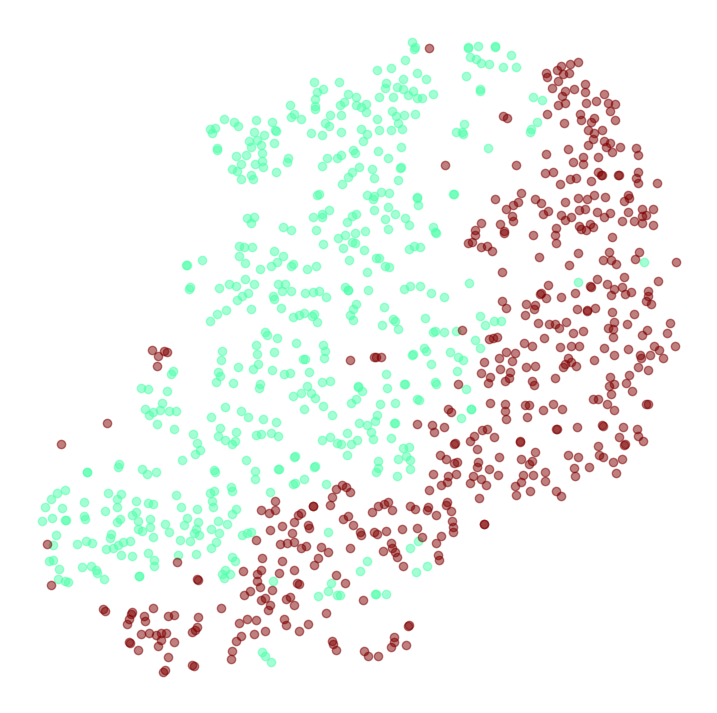

In [29]:
plt.figure(figsize=(9, 9))
for digit in ('4', '9'):
    plt.scatter(X_subset_reduced[y_subset == digit, 0],
                X_subset_reduced[y_subset == digit, 1],
                c=[cmap(float(digit) / 9)], alpha=0.5)
plt.axis('off')
plt.show()

That's much better, although there's still a bit of overlap. Perhaps some 4s really do look like 9s, and vice versa. It would be nice if we could visualize a few digits from each region of this plot, to understand what's going on. In fact, let's do that now.

*Exercise: Alternatively, you can replace each dot in the scatterplot with the corresponding instance’s class (a digit from 0 to 9), or even plot scaled-down versions of the digit images themselves (if you plot all digits, the visualization will be too cluttered, so you should either draw a random sample or plot an instance only if no other instance has already been plotted at a close distance). You should get a nice visualization with well-separated clusters of digits.*

Let's create a plot_digits() function that will draw a scatterplot (similar to the above scatterplots) plus write colored digits, with a minimum distance guaranteed between these digits. If the digit images are provided, they are plotted instead. This implementation was inspired from one of Scikit-Learn's excellent examples (plot_lle_digits, based on a different digit dataset).

In [30]:
from sklearn.preprocessing import MinMaxScaler
from matplotlib.offsetbox import AnnotationBbox, OffsetImage

def plot_digits(X, y, min_distance=0.04, images=None, figsize=(13, 10)):
    # Let's scale the input features so that they range from 0 to 1
    X_normalized = MinMaxScaler().fit_transform(X)
    # Now we create the list of coordinates of the digits plotted so far.
    # We pretend that one is already plotted far away at the start, to
    # avoid `if` statements in the loop below
    neighbors = np.array([[10., 10.]])
    # The rest should be self-explanatory
    plt.figure(figsize=figsize)
    cmap = plt.cm.jet
    digits = np.unique(y)
    for digit in digits:
        plt.scatter(X_normalized[y == digit, 0], X_normalized[y == digit, 1],
                    c=[cmap(float(digit) / 9)], alpha=0.5)
    plt.axis("off")
    ax = plt.gca()  # get current axes
    for index, image_coord in enumerate(X_normalized):
        closest_distance = np.linalg.norm(neighbors - image_coord, axis=1).min()
        if closest_distance > min_distance:
            neighbors = np.r_[neighbors, [image_coord]]
            if images is None:
                plt.text(image_coord[0], image_coord[1], str(int(y[index])),
                         color=cmap(float(y[index]) / 9),
                         fontdict={"weight": "bold", "size": 16})
            else:
                image = images[index].reshape(28, 28)
                imagebox = AnnotationBbox(OffsetImage(image, cmap="binary"),
                                          image_coord)
                ax.add_artist(imagebox)

Let's try it! First let's show colored digits (not images), for all 5,000 images:

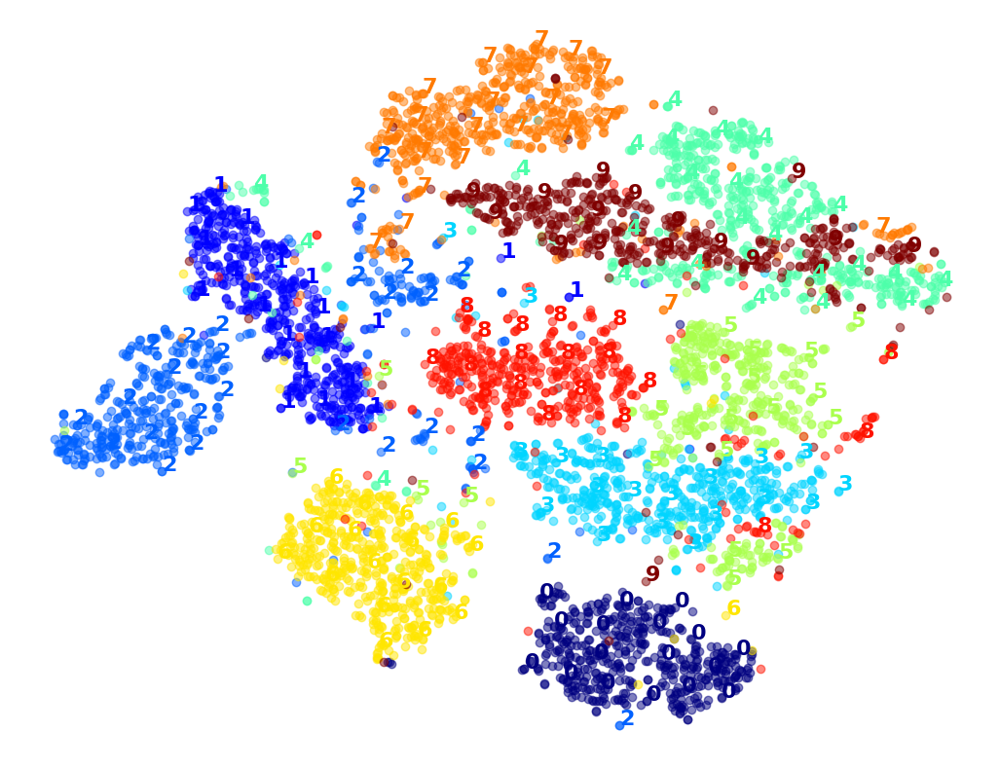

In [31]:
plot_digits(X_reduced, y_sample)

Well that's okay, but not that beautiful. Let's try with the digit images:

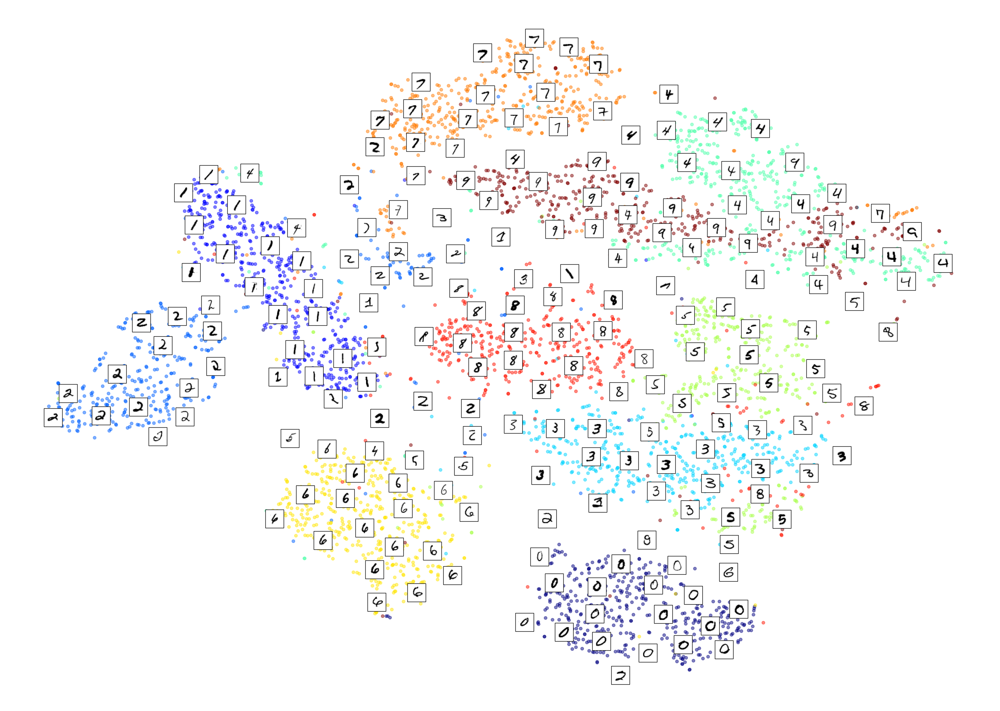

In [32]:
plot_digits(X_reduced, y_sample, images=X_sample, figsize=(35, 25))

That's nicer! Now let's focus on just the 3s and the 5s:



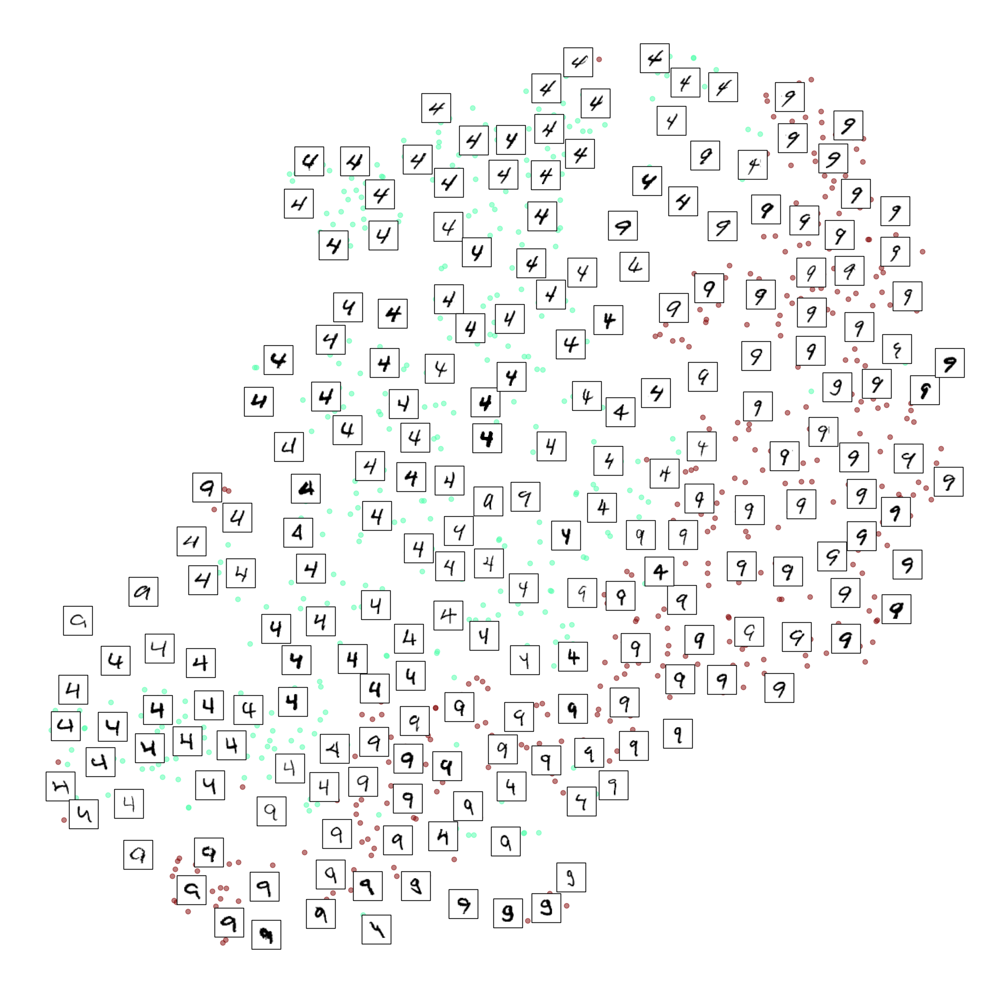

In [33]:
plot_digits(X_subset_reduced, y_subset, images=X_subset, figsize=(22, 22))

Notice how similar-looking 4s are grouped together. For example, the 4s get more and more inclined as they approach the top of the figure. The inclined 9s are also closer to the top. Some 4s really do look like 9s, and vice versa.

*Exercise: Try using other dimensionality reduction algorithms such as PCA, LLE, or MDS and compare the resulting visualizations.*

Let's start with PCA. We will also time how long it takes:

CPU times: user 323 ms, sys: 217 ms, total: 540 ms
Wall time: 419 ms


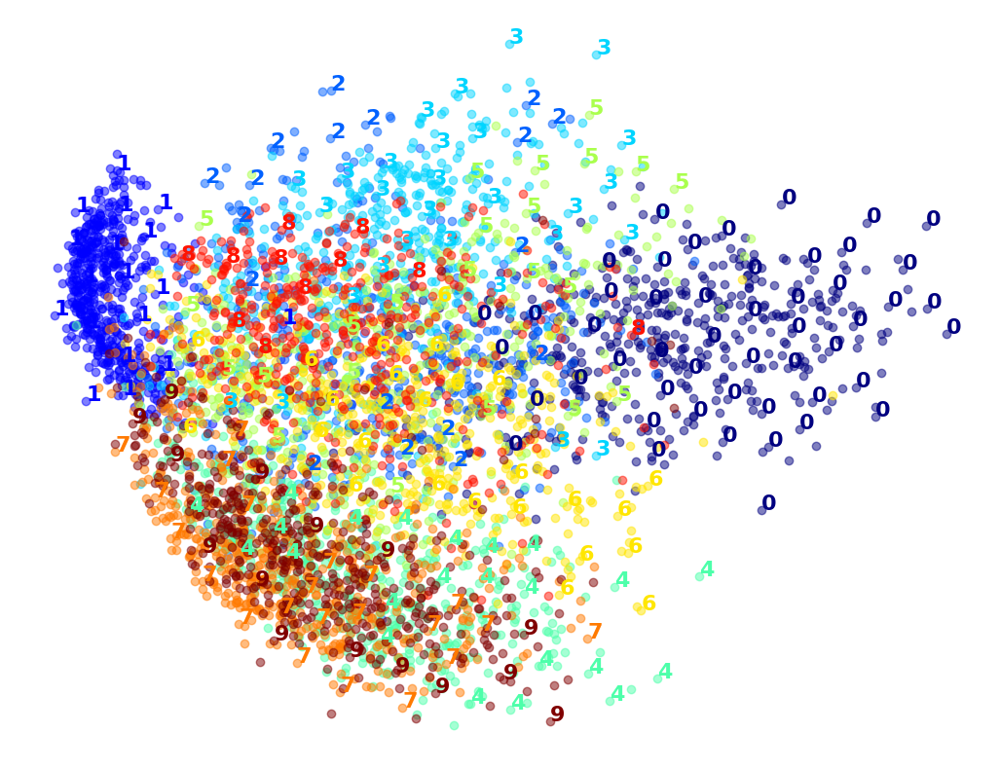

In [34]:
pca = PCA(n_components=2, random_state=42)
%time X_pca_reduced = pca.fit_transform(X_sample)
plot_digits(X_pca_reduced, y_sample)
plt.show()

 Let's try LLE:

CPU times: user 5.31 s, sys: 2.8 s, total: 8.11 s
Wall time: 6.98 s


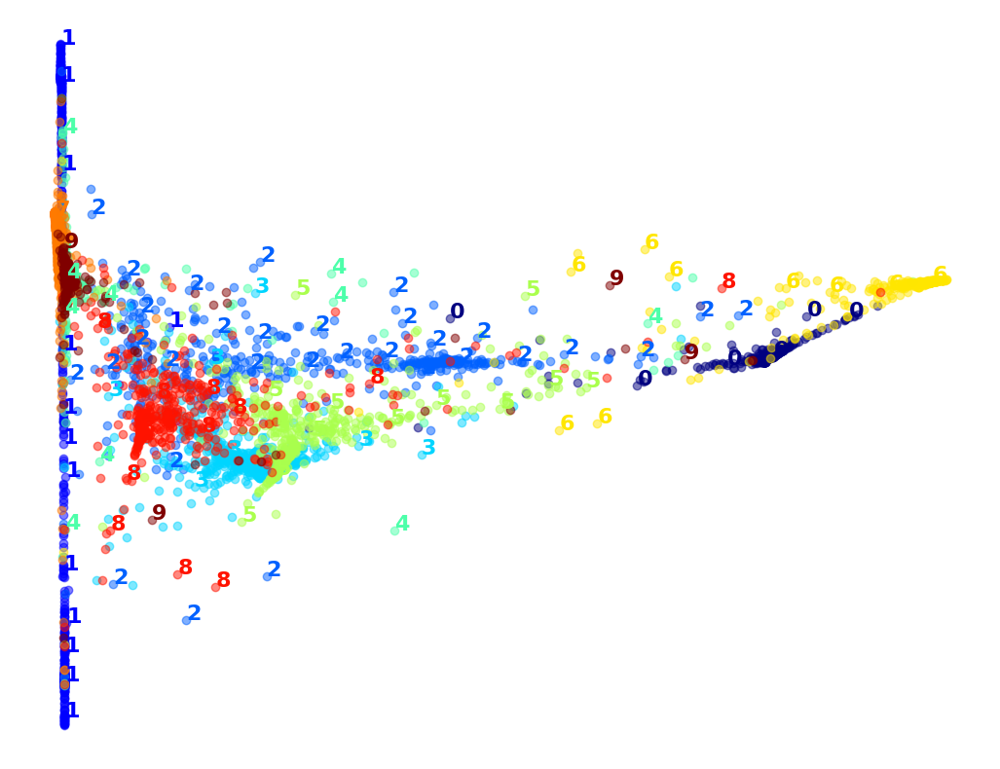

In [36]:
from sklearn.manifold import LocallyLinearEmbedding
lle = LocallyLinearEmbedding(n_components=2, random_state=42)
%time X_lle_reduced = lle.fit_transform(X_sample)
plot_digits(X_lle_reduced, y_sample)
plt.show()

That took more time, and yet the result does not look good at all. Let's see what happens if we apply PCA first, preserving 95% of the variance:

CPU times: user 5.02 s, sys: 2.11 s, total: 7.13 s
Wall time: 5.6 s


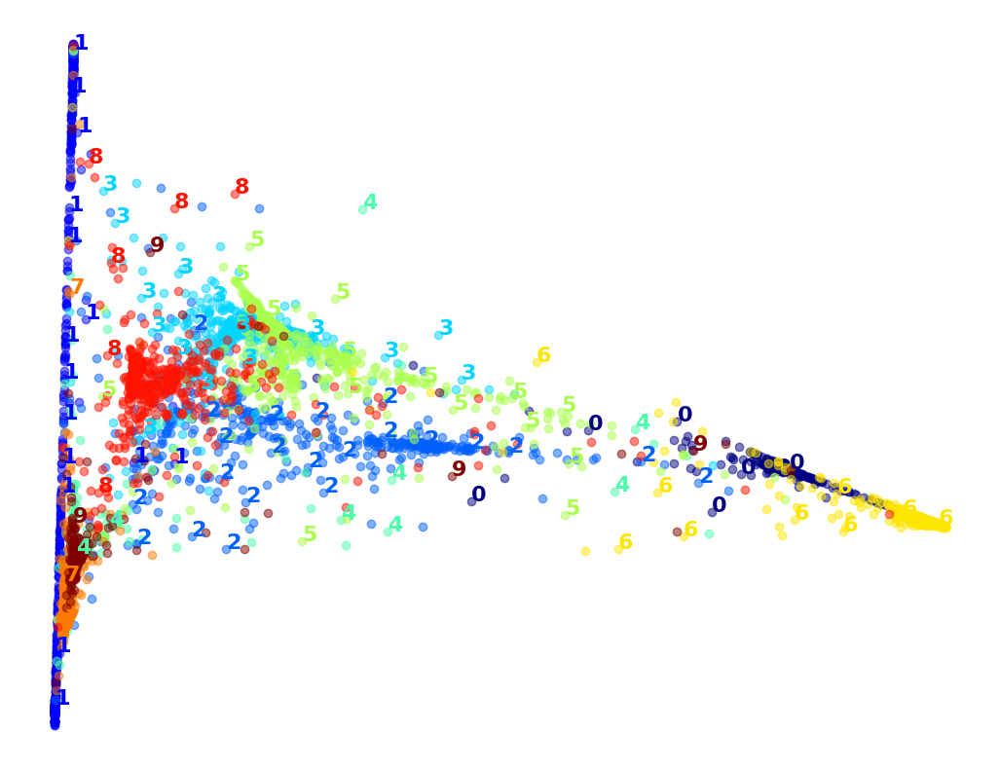

In [38]:
from sklearn.pipeline import make_pipeline
pca_lle = make_pipeline(PCA(n_components=0.95),
                        LocallyLinearEmbedding(n_components=2, random_state=42))

%time X_pca_lle_reduced = pca_lle.fit_transform(X_sample)
plot_digits(X_pca_lle_reduced, y_sample)
plt.show()

The result is more or less as bad, but this time training was a bit faster.

Let's try LDA

CPU times: user 2.43 s, sys: 630 ms, total: 3.06 s
Wall time: 2.65 s


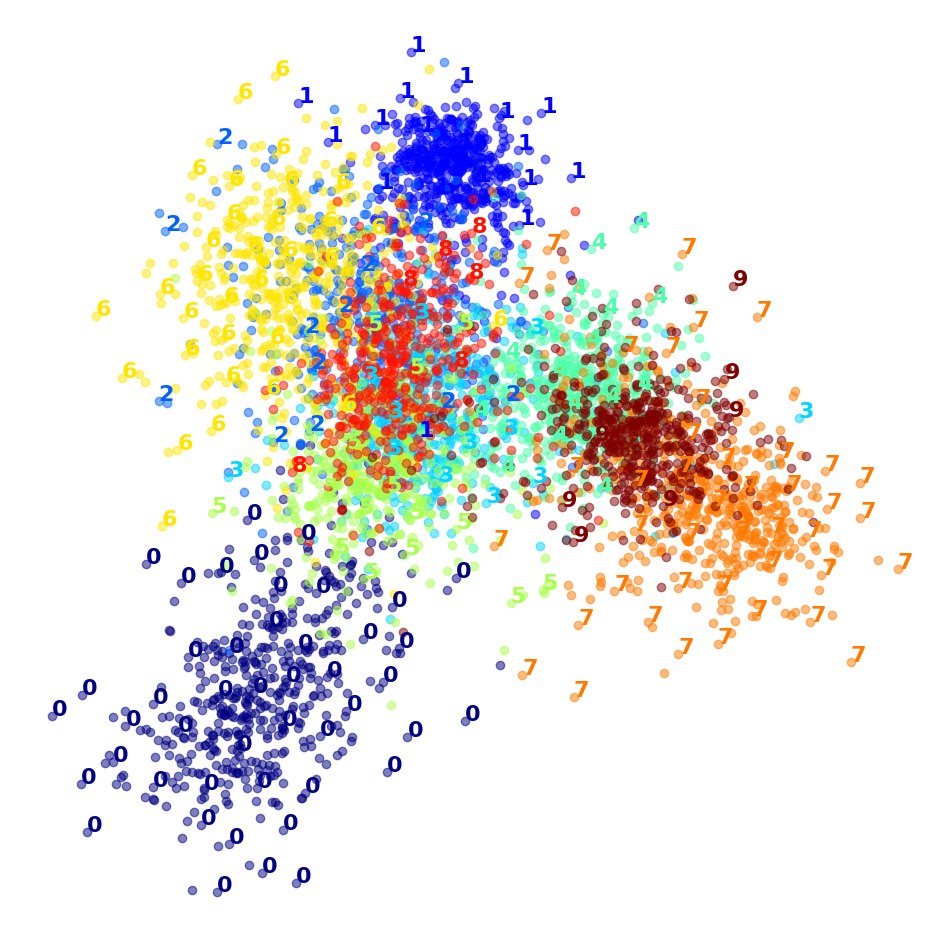

In [39]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

lda = LinearDiscriminantAnalysis(n_components=2)
%time X_lda_reduced = lda.fit_transform(X_sample, y_sample)
plot_digits(X_lda_reduced, y_sample, figsize=(12, 12))
plt.show()

This one is very fast, and it looks nice at first, until you realize that several clusters overlap severely.

Well, it's pretty clear that t-SNE won this little competition

